## still a draft
## maybe ok if correlation matrix has no nan
## coding style, try to follow rules

In [2]:
import numpy as np
import pandas as pd

In [3]:
import matplotlib.pyplot as plt
#plt.rcParams["figure.figsize"][0] = 12
#plt.rcParams["figure.figsize"][1] = 8

In [4]:
plt.rcParams["figure.figsize"][0] = 9
plt.rcParams["figure.figsize"][1] = 6

In [5]:
## additional import

from sklearn.metrics import matthews_corrcoef
from sklearn.cross_validation import train_test_split
from sklearn.preprocessing import LabelEncoder
#from sklearn.preprocessing import OneHotEncoder
import gc
from tqdm import tqdm

/usr/bin/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [6]:
# import necessaries
#project into 3-dim with pca
from mpl_toolkits import mplot3d
#import matplotlib.pyplot as plt
from sklearn import decomposition

In [7]:
#data = pd.read_table("aps_failure_training_set.csv", header=None)
## customer
data = pd.read_csv("data.csv")
data.head()

,Unnamed: 0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X170,X171,X172,X173,X174,X175,X176,X177,X178,y
0,X21.V1.791,135,190,229,223,192,125,55,-9,-33,...,-17,-15,-31,-77,-103,-127,-116,-83,-51,4
1,X15.V1.924,386,382,356,331,320,315,307,272,244,...,164,150,146,152,157,156,154,143,129,1
2,X8.V1.1,-32,-39,-47,-37,-32,-36,-57,-73,-85,...,57,64,48,19,-12,-30,-35,-35,-36,5
3,X16.V1.60,-105,-101,-96,-92,-89,-95,-102,-100,-87,...,-82,-81,-80,-77,-85,-77,-72,-69,-65,5
4,X20.V1.54,-9,-65,-98,-102,-78,-48,-16,0,-21,...,4,2,-12,-32,-41,-65,-83,-89,-73,5


In [8]:
## encoding feature 0?
## value_count first
data.iloc[:, 0].value_counts()

X16.V1.86     1
X14.V1.131    1
X13.V1.510    1
X12.V1.8      1
X20.V1.224    1
X14.V1.813    1
X11.V1.323    1
X22.V1.794    1
X5.V1.854     1
X7.V1.191     1
X11.V1.364    1
X23.V1.77     1
X5.V1.791     1
X18.V1.76     1
X18.V1.822    1
X13.V1.683    1
X23.V1.37     1
X12.V1.24     1
X1.V1.801     1
X5.V1.48      1
X19.V1.843    1
X1.V1.92      1
X6.V1.912     1
X12.V1.95     1
X23.V1.181    1
X14.V1.6      1
X16.V1.911    1
X4.V1.562     1
X19.V1.941    1
X22.V1.14     1
             ..
X5.V1.617     1
X17.V1.194    1
X22.V1.752    1
X23.V1.952    1
X13.V1.691    1
X12.V1        1
X12.V1.4      1
X18.V1.592    1
X17.V1.904    1
X23.V1.810    1
X13.V1.601    1
X4.V1.644     1
X12.V1.793    1
X3.V1.653     1
X2.V1.522     1
X7.V1.494     1
X1.V1.434     1
X9.V1.753     1
X1.V1.512     1
X17.V1.42     1
X8.V1.824     1
X13.V1.441    1
X15.V1.711    1
X13.V1.417    1
X3.V1.681     1
X4.V1.817     1
X22.V1.673    1
X10.V1.434    1
X9.V1.804     1
X3.V1.582     1
Name: Unnamed: 0, Length

In [9]:
## only names
## drop 1 columns
dataTemp = data.drop(['Unnamed: 0'], axis=1)
dataTemp.head()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X170,X171,X172,X173,X174,X175,X176,X177,X178,y
0,135,190,229,223,192,125,55,-9,-33,-38,...,-17,-15,-31,-77,-103,-127,-116,-83,-51,4
1,386,382,356,331,320,315,307,272,244,232,...,164,150,146,152,157,156,154,143,129,1
2,-32,-39,-47,-37,-32,-36,-57,-73,-85,-94,...,57,64,48,19,-12,-30,-35,-35,-36,5
3,-105,-101,-96,-92,-89,-95,-102,-100,-87,-79,...,-82,-81,-80,-77,-85,-77,-72,-69,-65,5
4,-9,-65,-98,-102,-78,-48,-16,0,-21,-59,...,4,2,-12,-32,-41,-65,-83,-89,-73,5


In [10]:
## check missing
dataTemp.isnull().any().any()


False

In [11]:
DimT = len(dataTemp.columns)
print(DimT)

179


In [12]:
## now load y label since need to drop 0th row

#y_temp = pd.read_csv('secom_labels.data.txt', sep=' ', header=None)
y_temp = dataTemp.iloc[:, DimT-1]


#y_temp = y_temp.drop([0,1])
y_temp.head()

0    4
1    1
2    5
3    5
4    5
Name: y, dtype: int64

y_label = y_temp.iloc[:, 0]
y_label[ y_label == -1] = 0
y_label

In [13]:
y_temp.value_counts()

5    2300
4    2300
3    2300
2    2300
1    2300
Name: y, dtype: int64

In [14]:
## deal with label
## 1 against rest first
N = len(y_temp)
y_label = np.zeros(N)
y_label[y_temp == 1] = 1

# y_label ready

In [15]:
## drop label
dataTemp2 = dataTemp.drop(['y'], axis=1)
dataTemp2.head()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X169,X170,X171,X172,X173,X174,X175,X176,X177,X178
0,135,190,229,223,192,125,55,-9,-33,-38,...,8,-17,-15,-31,-77,-103,-127,-116,-83,-51
1,386,382,356,331,320,315,307,272,244,232,...,168,164,150,146,152,157,156,154,143,129
2,-32,-39,-47,-37,-32,-36,-57,-73,-85,-94,...,29,57,64,48,19,-12,-30,-35,-35,-36
3,-105,-101,-96,-92,-89,-95,-102,-100,-87,-79,...,-80,-82,-81,-80,-77,-85,-77,-72,-69,-65
4,-9,-65,-98,-102,-78,-48,-16,0,-21,-59,...,10,4,2,-12,-32,-41,-65,-83,-89,-73


In [16]:
dataTemp2.describe()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X169,X170,X171,X172,X173,X174,X175,X176,X177,X178
count,11500.000000,11500.000000,11500.000000,11500.000000,11500.000000,11500.000000,11500.000000,11500.00000,11500.00000,11500.000000,...,11500.000000,11500.000000,11500.000000,11500.000000,11500.000000,11500.000000,11500.000000,11500.000000,11500.000000,11500.000000
mean,-11.581391,-10.911565,-10.187130,-9.143043,-8.009739,-7.003478,-6.502087,-6.68713,-6.55800,-6.168435,...,-9.498870,-10.145739,-11.630348,-12.943478,-13.668870,-13.363304,-13.045043,-12.705130,-12.426000,-12.195652
std,165.626284,166.059609,163.524317,161.269041,160.998007,161.328725,161.467837,162.11912,162.03336,160.436352,...,165.235574,164.652883,166.149790,168.554058,168.556486,167.257290,164.241019,162.895832,162.886311,164.852015
min,-1839.000000,-1838.000000,-1835.000000,-1845.000000,-1791.000000,-1757.000000,-1832.000000,-1778.00000,-1840.00000,-1867.000000,...,-1860.000000,-1867.000000,-1865.000000,-1642.000000,-1723.000000,-1866.000000,-1863.000000,-1781.000000,-1727.000000,-1829.000000
25%,-54.000000,-55.000000,-54.000000,-54.000000,-54.000000,-54.000000,-54.000000,-55.00000,-55.00000,-54.000000,...,-55.000000,-55.000000,-56.000000,-56.000000,-56.000000,-55.000000,-56.000000,-55.000000,-55.000000,-55.000000
50%,-8.000000,-8.000000,-7.000000,-8.000000,-8.000000,-8.000000,-8.000000,-8.00000,-7.00000,-7.000000,...,-8.000000,-9.000000,-10.000000,-10.000000,-10.000000,-10.000000,-9.000000,-9.000000,-9.000000,-9.000000
75%,34.000000,35.000000,36.000000,36.000000,35.000000,36.000000,35.000000,36.00000,36.00000,35.250000,...,35.000000,34.000000,34.000000,33.000000,33.000000,34.000000,34.000000,34.000000,34.000000,34.000000
max,1726.000000,1713.000000,1697.000000,1612.000000,1518.000000,1816.000000,2047.000000,2047.00000,2047.00000,2047.000000,...,2047.000000,1777.000000,1472.000000,1319.000000,1436.000000,1733.000000,1958.000000,2047.000000,2047.000000,1915.000000


In [17]:
## drop std == 0 
STD_DES = dataTemp2.describe().loc['std']
zeros = np.where(STD_DES == 0)[0]
zeros

array([], dtype=int64)

In [ ]:
## random sample data since too large
## from train test split?



In [ ]:
## for Epileptic 
## 1 against rest
## 1 against another(2,3,4,5)(latter)


In [ ]:
# ---------------- process --------------------

## import dataset

## recognize y_label
## X be dataFrame, y be series
## see if need reduce row with random sampling split

## deal with nan

## plotly to check distribution, see shape
### whole
## Laplacian, see best k from eigen gap(make function)
### clustered


In [ ]:
## see whole first


In [18]:
colors = ['rgb(55,126,184)','rgb(228,26,28)','rgb(77,175,74)']

layout = dict(
    width=800,
    height=550,
    autosize=False,
    title='tryout',
    scene=dict(
        xaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        yaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        zaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        aspectratio = dict( x=1, y=1, z=0.7 ),
        #aspectmode = 'manual'        
    ),
)


In [19]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

In [20]:
def plotly_PCAproj_xy(X, y_label, 
                      names, colors, layout, 
                      n_comp = 3):

    Xtemp = X.values.copy()
    
    pca = decomposition.PCA(n_components=n_comp)
    pca.fit(Xtemp)
    # maybe can put separately
    Xpr = pca.transform(Xtemp)

    # for safety, using numpy tool after transform
    #y_temp = y.values.copy()
    
    #Xpr_n = Xpr[np.where(y_temp == 0)[0]]
    #Xpr_a = Xpr[np.where(y_temp == 1)[0]]
    
    ## running
    data = []

    for i in range(0, 2):
        # 0 normal 1 anomaly
        temp = X.loc[y_label == i]
        temp_now = pca.transform(temp)

        name = names
        color = colors[i]
        x = temp_now[:,0]
        y = temp_now[:,1]
        z = temp_now[:,2]

        trace = dict(
                name = name,
                x = x, y = y, z = z,
                type = "scatter3d",    
                mode = 'markers',
                marker = dict( size=2, color=color, line=dict(width=0) ) )
        data.append(trace)
    len(data)    
    # plot
    fig = dict(data=data, layout=layout)

    # IPython notebook
    iplot(fig, filename='implement', validate=False)

In [21]:
## optional
pStr = 'Epileptic'

## get y_label
## may need transform to 0 1
# manuelly

dataX = dataTemp2.drop([1558], axis = 1)


y_temp = dataTemp2.iloc[:, 1558]
y_label = np.zeros(len(y_temp))
y_label[ y_temp == pStr ] = 1
## y ready

In [22]:
dataX = dataTemp
y_current = y_label
#y_label = y_temp
# y_label ready

In [38]:
## random sample
selectIdx = np.random.choice(60000, 10000, replace=False)
selectIdx

array([ 5637, 46215, 36675, ..., 21690, 14182,  1552])

In [39]:
dataX = dataTemp4.iloc[selectIdx]
y_current = y_label[selectIdx]

In [62]:
## plot whole
names = 'Epileptic whole'
plotly_PCAproj_xy(dataX, y_current, 
                  names, colors, layout, 
                  n_comp=3)

In [23]:
def showLaplacian(currentData, pickN=100):
    tempW = currentData.corr().values
    weight_abs = abs(tempW)
    #w_abs
    plt.imshow(weight_abs)
    #show scale of colors
    plt.colorbar()
    plt.show()
    
    ## for correlation matrix, take normal only at first
    # plot out eigen gap first

    from scipy.sparse import csgraph

    ## note: from github, normalized Laplacian is symmetric

    Lsym = csgraph.laplacian(weight_abs, normed = True)

    # eigen decomposition
    from numpy import linalg as LA
    w, v = LA.eig(Lsym)
    sortW = np.sort(w) # no need order here

    ## plot out
    ## adjust plot parameter

    tempX = np.arange(len(sortW))+1

    plt.scatter(tempX, sortW)
    plt.plot(tempX, sortW)
    plt.show()
    
    
    ## plot eigen difference

    diffSortW = np.diff(sortW)

    tempX = np.arange(len(diffSortW))+1

    # bar plot
    plt.bar(tempX, diffSortW)
    plt.show()
    
    ## show top candidates of k choices
    ## see eigen gap, find from big to small
    ## just print out at first
    ## for i in diffSortW, means eigen i+1 - i
    ## but python start from 0, so add 1 
    rank0 = np.argsort(-diffSortW)
    rank = rank0[0:pickN]+1
    
    #print(rank0[0:pickN])
    print(rank)
    
    

    return weight_abs, diffSortW, rank

In [24]:
## take away y_label
currentData = dataX

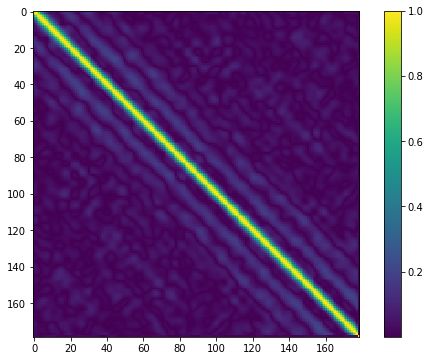

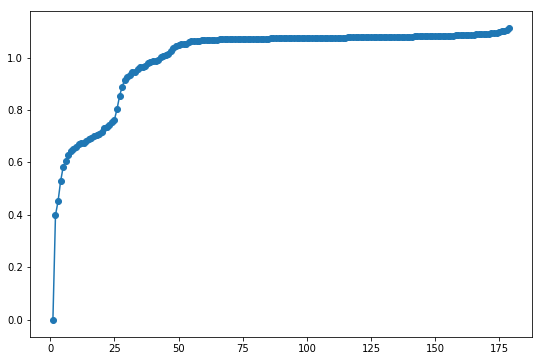

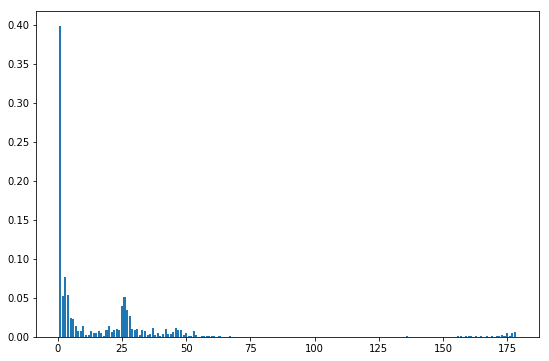

[  1   3   4   2  26  25  27  28   5   6  20   7  10  37  46  23  42  29
  31  47  24  33  48  30  22  19  16   9  34  53  13   8 178  21  45  50
 177  14  17 175  15  39  36  43  44  41  12  35  49 173  38  11  32  54
  18  58 165  57 161  52  40 174 163 171 159  51 167  56 156  59 176  60
  63 157 172  67  61 136 169 160 145 129  65 124  85 150 147  90 170 152
 153  79 121  81 106  66 168  78 154 140]


In [25]:
sPack = showLaplacian(currentData)
weight_abs = sPack[0]
diffSortW = sPack[1]
rank = sPack[2]

In [26]:
k = rank[1]
print(k)

3


In [27]:
from sklearn.cluster import spectral_clustering

# might have no choice to choose k = 2
labels = spectral_clustering(weight_abs, 
                             n_clusters=k, eigen_solver='arpack')

## get cluster index once and for all
feaNumArr = [None]*k
for clusKey in range(0, k):
    featureNum = np.where(labels == clusKey)[0]
    feaNumArr[clusKey] = featureNum
print(feaNumArr)

[array([ 43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,
        56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,
        69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,
        82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,
        95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107,
       108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 178]), array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42]), array([119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131,
       132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144,
       145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157,
       158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170,
       171, 172, 173, 174, 175, 176, 177])]


In [28]:
import matplotlib.patches as patches

In [29]:
def reArrangeW(labels, currentData):
    ## show correlation matrix with rearrangement

    arrange = np.zeros(len(labels))
    idxH = 0
    # rearrenge
    for clusKey in range(0, k):
        featureNum = np.where(labels == clusKey)[0]

        idxE = idxH + len(featureNum)

        # become float type
        arrange[idxH:idxE] = featureNum

        #updata index
        idxH = idxE

        #print(arrange)

    # transform back to integer
    arrange = arrange.astype(int)
    
    # indexing with iloc
    reArrData = currentData.iloc[:, arrange]
    tempW = reArrData.corr().values
    weight_abs = abs(tempW)
    
    
    # Create figure and axes
    fig,ax = plt.subplots(1)
    
    
    #w_abs
    ax.imshow(weight_abs)
    #show scale of colors
    #plt.colorbar()
    
    
    ## add blocks here
    # Create a Rectangle patch
    ## adjust 0.5, by Yang (ˊ● ω ●ˋ)
    sPoint = np.zeros(2)-0.5
    for clusKey in range(0, k):
        featureNum = np.where(labels == clusKey)[0]
        width = len(featureNum)
        
        rect = patches.Rectangle(sPoint, width, width,linewidth=1,edgecolor='white',facecolor='none')
        ax.add_patch(rect)

        
        sPoint = sPoint + width
    plt.show()

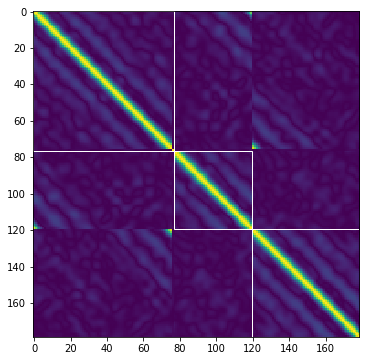

In [30]:
reArrangeW(labels, currentData)

In [ ]:
## import here


In [31]:
colors = ['rgb(55,126,184)','rgb(228,26,28)','rgb(77,175,74)']

In [32]:
layout = dict(
    width=800,
    height=550,
    autosize=False,
    title='tryout',
    scene=dict(
        xaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        yaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        zaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        aspectratio = dict( x=1, y=1, z=0.7 ),
        #aspectmode = 'manual'        
    ),
)


In [36]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

## fix printout problem, refine rate_limit
## ref: https://stackoverflow.com/questions/43288550/iopub-data-rate-exceeded-when-viewing-image-in-jupyter-notebook
## ref: 

In [37]:
## prepare list for plotly first
## deal with data inside function
## only plot one each time QQ

In [33]:
## define function
## plot both data and label
## using plotly for interactive

# x should be dataframe, y should be series or np array
# X: original, Xpr: projected

# no need title
def plotly_PCAproj_xy(X, y_label, 
                      names, colors, layout, 
                      n_comp = 3):

    Xtemp = X.values.copy()
    
    pca = decomposition.PCA(n_components=n_comp)
    pca.fit(Xtemp)
    # maybe can put separately
    Xpr = pca.transform(Xtemp)

    # for safety, using numpy tool after transform
    #y_temp = y.values.copy()
    
    #Xpr_n = Xpr[np.where(y_temp == 0)[0]]
    #Xpr_a = Xpr[np.where(y_temp == 1)[0]]
    
    ## running
    data = []

    for i in range(0, 2):
        # 0 normal 1 anomaly
        temp = X.loc[y_label == i]
        temp_now = pca.transform(temp)

        name = names
        color = colors[i]
        x = temp_now[:,0]
        y = temp_now[:,1]
        z = temp_now[:,2]

        trace = dict(
                name = name,
                x = x, y = y, z = z,
                type = "scatter3d",    
                mode = 'markers',
                marker = dict( size=2, color=color, line=dict(width=0) ) )
        data.append(trace)
    len(data)    
    # plot
    fig = dict(data=data, layout=layout)

    # IPython notebook
    iplot(fig, filename='implement', validate=False)
    
    
# 3-D plot
# X as dataFrame
# maybe no title first
def plotly_3D_xy(X, y_label, 
                 names, colors, layout):

    data = []

    for i in range(0, 2):
        # 0 normal 1 anomaly
        temp_now = X.loc[y_label == i].copy()
        print(i, len(temp_now), len(X))

        name = names
        color = colors[i]
        x = temp_now.iloc[:,0].values.copy()
        y = temp_now.iloc[:,1].values.copy()
        z = temp_now.iloc[:,2].values.copy()

        trace = dict(
                name = name,
                x = x, y = y, z = z,
                type = "scatter3d",    
                mode = 'markers',
                marker = dict( size=2, color=color, line=dict(width=0) ) )
        
        data.append(trace)  
    # plot
    fig = dict(data=data, layout=layout)

    # IPython notebook
    iplot(fig, filename='implement', validate=False)

    
## 2-D plot
# X as dataFrame
## for 2D, original plt is enough
def plot2D_xy(X, y):
    # normal
    Xpr_n = X.loc[y == 0].values.copy()
    # anomaly
    Xpr_a = X.loc[y == 1].values.copy()
    
    ax = plt.axes()

    
    plt.plot(Xpr_n[:,0], Xpr_n[:,1], 'co')
    plt.plot(Xpr_a[:,0], Xpr_a[:,1], 'ro')
    
    
    #plt.plot(Xpr[:,0], Xpr[:,1])
    plt.xlabel(X.columns[0])
    plt.ylabel(X.columns[1])

    plt.show()


## see if need to control n rows

In [34]:
tempY = y_label
tempY

array([ 0.,  1.,  0., ...,  0.,  0.,  0.])

In [58]:
## if random selected, in order to prevent out of memory
currentData = dataX
tempY = y_current

for clusKey in range(0, 10):
    featureNum = feaNumArr[clusKey]
    X = currentData.iloc[:, featureNum]
    
    print("Cluster ", clusKey)
    print(featureNum)
    if len(featureNum) > 3:
        print("PCA into 3 dim")
        plotly_PCAproj_xy(X, tempY, names, colors, layout)
    elif len(featureNum) == 3:
        print("3D plot")
        plotly_3D_xy(X, tempY, names, colors, layout)
    elif len(featureNum) == 2:
        plot2D_xy(X, tempY)
    else:
        print("In ", clusKey, ", only 1 dimension")

In [43]:
currentData.describe()

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
count,1.000000e+04,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,1.000000e+04,1.000000e+04,...,1.000000e+04,1.000000e+04,1.000000e+04,1.000000e+04,1.000000e+04,1.000000e+04,1.000000e+04,1.000000e+04,10000.000000,10000.000000
mean,5.834744e+04,0.703703,3.565504e+08,47498.198830,6.576565,10.973473,85.924218,8.089656e+02,7.761520e+03,8.175575e+04,...,4.372986e+05,2.063998e+05,4.370666e+05,3.945847e+05,3.283724e+05,3.279924e+05,1.423564e+05,8.643377e+03,0.073949,0.272076
std,1.380211e+05,0.999540,7.740880e+08,82094.405695,80.135177,162.696879,3587.540029,2.312422e+04,1.227618e+05,6.698831e+05,...,1.041475e+06,4.737206e+05,1.017440e+06,1.145127e+06,1.042082e+06,1.555065e+06,4.496062e+05,4.359521e+04,3.808351,11.940947
min,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,8.800000e+02,0.713189,1.800000e+01,44.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,3.291000e+03,1.307000e+03,3.041500e+03,4.517500e+03,5.940000e+02,1.440000e+02,0.000000e+00,0.000000e+00,0.000000,0.000000
50%,3.098600e+04,0.713189,1.900000e+02,292.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,2.462300e+05,1.181470e+05,2.341290e+05,1.995060e+05,1.066990e+05,4.666700e+04,5.090000e+03,0.000000e+00,0.000000,0.000000
75%,4.966900e+04,0.713189,1.624500e+03,7981.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,4.454897e+05,2.186065e+05,4.663140e+05,4.035375e+05,2.879630e+05,1.751900e+05,1.445095e+05,2.649000e+03,0.000000,0.000000
max,2.220448e+06,52.000000,2.130707e+09,190620.639314,2572.000000,9040.000000,278514.000000,1.909708e+06,5.839902e+06,2.904730e+07,...,2.015004e+07,9.753888e+06,2.119694e+07,4.792389e+07,3.160781e+07,4.304263e+07,1.456059e+07,1.695086e+06,350.000000,1146.000000


In [77]:
for clusKey in range(0, k):
    featureNum = feaNumArr[clusKey]
    X = currentData.iloc[:, featureNum]
    
    print("Cluster ", clusKey)
    print(featureNum)
    if len(featureNum) > 3:
        print("PCA into 3 dim")
        plotly_PCAproj_xy(X, tempY, names, colors, layout)
    elif len(featureNum) == 3:
        print("3D plot")
        plotly_3D_xy(X, tempY, names, colors, layout)
    elif len(featureNum) == 2:
        plot2D_xy(X, tempY)
    else:
        print("In ", clusKey, ", only 1 dimension")

Cluster  0
[  6   8  16  21  22  25  26  27  37  38  39  47  49  51  52  55  56  71
  76  80  81  85  87  97  98  99 107 111 112 113 117 118 119 136 137 138
 141 142 143 149]
PCA into 3 dim


Cluster  1
[  7  10  12  13  14  17  19  43  44  45  48  53  72  73  74  77  79 102
 103 104 105 108 109 110 134]
PCA into 3 dim


Cluster  2
[  3   5   9  23  24  28  29  33  34  36  42  54  58  59  60  63  64  84
  88  89  92  96 114 115 116 120 121 122 126 127 128 129 150 151 152 157
 158]
PCA into 3 dim


Cluster  3
[  0   4  15  30  31  32  35  41  46  61  62  65  66  68  75  83  90  91
  93  94  95 101 123 124 125 130 131 144 145 146 153 154 155 156 159 160
 161 162 163 164 165 166]
PCA into 3 dim


Cluster  4
[  1   2  40  57  67  69  70  86 100 106 135 147 148]
PCA into 3 dim


Cluster  5
[ 11  18  20  50  78  82 132 133 139 140]
PCA into 3 dim


tempY = y_train['Response']

In [ ]:
## do manuelly
## copy cluster elements

featureNum = np.array([22, 23, 25, 26, 27])

In [ ]:
## cluster 10(?): 22 23 25 26 27

In [ ]:
str(featureNum)

In [40]:
names = 'APS whole'

In [61]:
clusKey = 2
#X = X_train.iloc[:, featureNum]
featureNum = feaNumArr[clusKey]

X = currentData.iloc[:, featureNum]
#tempY = y_label[idxT]
    
#print("Cluster ", clusKey)
print(featureNum)
if len(featureNum) > 3:
    print("PCA into 3 dim")
    plotly_PCAproj_xy(X, tempY, names, colors, layout)
elif len(featureNum) == 3:
    print("3D plot")
    plotly_3D_xy(X, tempY, names, colors, layout)
elif len(featureNum) == 2:
    plot2D_xy(X, tempY)
else:
    print("In ", clusKey, ", only 1 dimension")

[119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136
 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154
 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172
 173 174 175 176 177]
PCA into 3 dim


## try detecting

In [35]:
def Track_w(x, w, d, beta):
    y = x.dot(w)
    d = beta*d + y*y
    e = x- y*w
    wNew = w + (y/d)*e
    return wNew, d

#becareful shape of sim_pool


def OD_onlinePCA_m(A, beta):
    #here A is 2-dim array
    
    #row, col of A
    n, p = A.shape
    
    A_m = np.mean(A, axis = 0)
    d = 0.0001
    u = np.ones(p)
    
    for i in tqdm(range(0, n)):
        u ,d = Track_w(A[i,:]-A_m, u, d, 1)
    #end
    u = u/np.linalg.norm(u)
    
    sim_pool = np.zeros(n)
    ratio = 1/(n*beta)
    
    for i in tqdm(range(0,n)):
        temp_mu = (A_m + ratio*A[i,:])/ (1+ratio)
        x = A[i, :] - temp_mu
        
        w1, d1 = Track_w(x, u, d, beta)
        w1 = w1/ np.linalg.norm(w1)
        
        sim_pool[i] = abs(u.dot(w1) )
        
        #if i%10000 == 0:
            #print('iteration '+ str(i))
        
    #end

    suspicious_index = np.argsort(sim_pool)
    suspicious_score = 1-sim_pool
    
    return suspicious_index, suspicious_score, u, d

#becareful shape of sim_pool

#suspicious_index: turn order accending original index into rank array

def OD_onlinePCA_forget(A, beta, ini_For):
    #here A is 2-dim array
    
    #row, col of A
    n, p = A.shape
    
    A_m = np.mean(A, axis = 0)
    d = 0.0001
    u = np.ones(p)
    
    for i in tqdm(range(0, n)):
        u ,d = Track_w(A[i,:]-A_m, u, d, ini_For)
        #
        #print(u)
    #end
    u = u/np.linalg.norm(u)
    
    
    sim_pool = np.zeros(n)
    ratio = 1/(n*beta)
    
    for i in tqdm(range(0,n)):
        temp_mu = (A_m + ratio*A[i,:])/ (1+ratio)
        x = A[i, :] - temp_mu
        
        w1, d1 = Track_w(x, u, d, beta)
        w1 = w1/ np.linalg.norm(w1)
        
        sim_pool[i] = abs(u.dot(w1) )
        
        #if i%10000 == 0:
            #print('iteration '+ str(i))
        
    #end
    
    suspicious_index = np.argsort(sim_pool)
    suspicious_score = 1-sim_pool
    
    return suspicious_index, suspicious_score, u, d



In [36]:
## cleaning by droping top t%, remain top as threshold, via OD_onlinePCA_m
# drop with whole data, and clusterd data(k results)
# show threshold

# construct function since need implements many times

def cleanPCA(A, sRate, beta, ini_For = 1, drop_rate_t = 0.05):
    suspicious_index, suspicious_score, u, d = OD_onlinePCA_forget(A, beta, ini_For)
    
    #
    u0 = u
    
    #drop top t data, suspicious_index descending order
    print("A.shape[1] ", A.shape[1])
    dropN = int(A.shape[0]*drop_rate_t)
    
    cleanIdx = suspicious_index[dropN:len(suspicious_index)]
    cleanA = A[cleanIdx, :]
    
    print(dropN, cleanA.shape[0])
    
    #just check
    print(suspicious_score[suspicious_index])
    
    #print threshold, before deleting top datas
    # threshold = suspicious_score[cleanIdx[0]]
    
    #last from dropped
    threshold = suspicious_score[suspicious_index[dropN-1]]
    print("Threshold: ", threshold)
    
    
    
    
    #get new u
    betaR = 1/(sRate*cleanA.shape[0])
    suspicious_index, suspicious_score, u, d = OD_onlinePCA_forget(cleanA, betaR, ini_For)
    
    cleanCos = abs(u.dot(u0))
    print(cleanCos)
    # return pca from clean data, return threshold, new beta
    return u, d, threshold, betaR, cleanCos 

def detectScore(x, u, d, betaR):
    newU, newD = Track_w(x, u, d, betaR)
    
    newU = newU / np.linalg.norm(newU)
    score = 1 - abs(u.dot(newU))
    
    return score
    
    
#detecting

## test ready

# return 01 array, 1 as anomaly
def test_pca(testA, u, d, betaR, threshold, UPDATE = True, upFor = 1):
    N = testA.shape[0]
    result = np.zeros(N)
    
    u0 = np.copy(u)
    d0 = np.copy(d)
    
    for i in tqdm(range(0, N)):
        x = testA[i, :]
        #scoring
        score = detectScore(x, u0, d0, betaR)
        
        #print(score)
        
        #check threshold
        if score >= threshold:
            result[i] = 1
        else:
            # regarded it as normal
            # update if needed
            if UPDATE:
                newU, newD = Track_w(x, u0, d0, upFor)
                
                u0 = newU / np.linalg.norm(newU)
                d0 = newD
            
        
    #end for
    
    
    return result



In [37]:
## multiple cleaning

def cleanPCA_mul(feaNumArr, k, A, sRate, beta, ini_For = 1, drop_rate_t = 0.05):
    
    uArr = [None]*k
    dArr = np.zeros(k)
    thresholdArr = np.zeros(k)
    cleanCosArr = np.zeros(k)
    # betaR should be the same for all clusters
    
    # A already an array
    
    for clusKey in range(0, k):
        featureNum = feaNumArr[clusKey]
        tempA = A[:, featureNum]
        u, d, threshold, betaR, cleanCos = cleanPCA(tempA, sRate, beta, ini_For, drop_rate_t)
        
        uArr[clusKey] = u
        dArr[clusKey] = d
        thresholdArr[clusKey] = threshold
        cleanCosArr[clusKey] = cleanCos
        
    #maybe return objects, only uArr faced problem
    return uArr, dArr, thresholdArr, betaR, cleanCosArr


## scoring strategies for multiple clusters

# input scoringTable, thresholdArray, strategy(categorial variable)
# output boolean, if alert or not


def judgeAlert(scoringArr, thresholdArr, strategy):
    anomaly = False
    
    MAX = 0
    AVG = 1
    ANY = 2
    
    if strategy == MAX:
        score = np.max(scoringArr)
        threshold = np.max(thresholdArr)
        if score >= threshold:
            anomaly = True
        else :
            anomaly = False
        
    elif strategy == AVG:
        score = np.mean(scoringArr)
        threshold = np.mean(thresholdArr)
        if score >= threshold:
            anomaly = True
        else :
            anomaly = False
        
    elif strategy == ANY:
        k = len(thresholdArr)
        #print("k: ", k)
        for i in range(0, k):
            if scoringArr[i] >= thresholdArr[i]:
                anomaly = True
                #print(i, scoringArr[i], thresholdArr[i])
        #end for i
    

    
    return anomaly

# for multiple clustering, deciding scoring strategies
# detecting

## test ready

# return 01 array, 1 as anomaly
def test_pca_mul(feaNumArr, k, strategy, testA, uArr, dArr, betaR, thresholdArr, UPDATE = True, upFor = 1):
    N = testA.shape[0]
    result = np.zeros(N)
    scoringTable = np.zeros([N,k])
    
    uArr0 = np.copy(uArr)
    dArr0 = np.copy(dArr)
    
    for i in tqdm(range(0, N)):
        x = testA[i, :]
        
        scoringArr = np.zeros(k)
        xprArr = [None]*k
        for clusKey in range(0, k):
            #scoring
            featureNum = feaNumArr[clusKey]
            xpr = x[featureNum]
            xprArr[clusKey] = xpr
            
            u0 = uArr0[clusKey]
            d0 = dArr0[clusKey]
            
            score = detectScore(xpr, u0, d0, betaR)
            scoringArr[clusKey] = score
            
            #print(clusKey, score)            
        #end for clusKey
        
        scoringTable[i,:] = scoringArr
        # strategy variables, categorical
        anomaly = judgeAlert(scoringArr, thresholdArr, strategy)
        
        # check bool variables
        if anomaly:
            result[i] = 1
        else:
            # regarded it as normal
            # update if needed
            if UPDATE:
                # update each clusters
                for clusKey in range(0, k):
                    xpr = xprArr[clusKey]
                    u0 = uArr0[clusKey]
                    d0 = dArr0[clusKey]
                    newU, newD = Track_w(xpr, u0, d0, upFor)

                    u0 = newU / np.linalg.norm(newU)
                    d0 = newD
                    
                    uArr0[clusKey] = u0
                    dArr0[clusKey] = d0
            
        
    #end for
    
    
    return result, scoringTable

## function for dropping bad cluster

def checkCluster(thresholdArr, BDD):
    fineClus = np.where(thresholdArr >= BDD)[0]
    
    return fineClus

# for multiple clustering, deciding scoring strategies
# detecting

## test ready

# return 01 array, 1 as anomaly
def test_pca_mul_select(fineClus, feaNumArr, k, strategy, testA, uArr, dArr, betaR, thresholdArr, UPDATE = True, upFor = 1):
    N = testA.shape[0]
    result = np.zeros(N)
    scoringTable = np.zeros([N,k])
    
    uArr0 = np.copy(uArr)
    dArr0 = np.copy(dArr)
    
    for i in tqdm(range(0, N)):
        x = testA[i, :]
        
        scoringArr = np.zeros(k)
        xprArr = [None]*k
        for clusKey in fineClus:
            #scoring
            featureNum = feaNumArr[clusKey]
            xpr = x[featureNum]
            xprArr[clusKey] = xpr
            
            u0 = uArr0[clusKey]
            d0 = dArr0[clusKey]
            
            score = detectScore(xpr, u0, d0, betaR)
            scoringArr[clusKey] = score
            
            #print(clusKey, score)            
        #end for clusKey
        
        scoringTable[i,:] = scoringArr
        # strategy variables, categorical
        anomaly = judgeAlert(scoringArr[fineClus], thresholdArr[fineClus], strategy)
        
        # check bool variables
        if anomaly:
            result[i] = 1
        else:
            # regarded it as normal
            # update if needed
            if UPDATE:
                # update each clusters
                for clusKey in fineClus:
                    xpr = xprArr[clusKey]
                    u0 = uArr0[clusKey]
                    d0 = dArr0[clusKey]
                    newU, newD = Track_w(xpr, u0, d0, upFor)

                    u0 = newU / np.linalg.norm(newU)
                    d0 = newD
                    
                    uArr0[clusKey] = u0
                    dArr0[clusKey] = d0
            
        
    #end for
    
    
    return result, scoringTable



In [116]:
currentData = dataX
# y_label need back to series
## also bring back index

X_index = dataX.index

y_Series = pd.Series(y_label, index=X_index)
y_Series = y_Series.rename('label')
y_Series.head()


0    0.0
1    1.0
2    0.0
3    0.0
4    0.0
Name: label, dtype: float64

In [117]:
## do train test split in X
# split already imported
#X_train, X_test, y_train, y_test = train_test_split(currentData, y_Series, test_size = 0.5)

norNum = int(len(currentData)/2)
currentWhole = pd.concat([currentData, y_Series], axis=1)

norIdxTemp = currentWhole.loc[currentWhole['label'] == 0].index.values.copy()
norIdx = np.random.choice(norIdxTemp, norNum, replace=False)
X_nor_temp = currentWhole.loc[norIdx].copy()
X_nor = X_nor_temp.drop(['label'], axis=1)

X_test_temp = currentWhole.drop(X_nor.index, axis=0)
X_test_temp2 = X_test_temp.sample(frac=1)
y_test = X_test_temp2['label']
X_test = X_test_temp2.drop(['label'], axis=1)

In [118]:
y_true = y_test

y_train.value_counts()

In [119]:
y_test.value_counts()

0.0    3450
1.0    2300
Name: label, dtype: int64

FailIdx = y_train.loc[ y_train == 1].index
FailIdx

## get fail from y_train
FailIdx = y_train.loc[y_train == 1].index.values
norY = y_train.drop(FailIdx, axis = 0)
norY.describe()

X_nor = X_train.drop(FailIdx, axis = 0)

In [120]:
## whole
A = X_nor.astype(float).values.copy()
A.shape

(5750, 179)

In [129]:
sRate = 0.2
beta = 1/(sRate*len(X_nor))
dropRateT = 0.02

In [122]:
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix

In [130]:
## put tqdm in pca
A = X_nor.astype(float).values.copy()


u, d, threshold, betaR, cleanCos = cleanPCA(A, sRate, beta, ini_For = 1, drop_rate_t = dropRateT)

print('--------------------')



#get y_labels
testA = X_test.astype(float).values.copy()

# detecting
## with check if all time nan in row, answer normal
## ignore it first, since only few hundred
result = test_pca(testA, u, d, betaR, threshold)


tn, fp, fn, tp = confusion_matrix(y_true, result).ravel()

# ref: https://stats.stackexchange.com/questions/95209/how-can-i-interpret-sklearn-confusion-matrix
print('tpr: ', tp/(tp+fn), ', fpr: ', fp/(tn+fp))
pd.crosstab(y_true, result ,rownames=['True'], colnames=['Predicted'], margins=True)

  0%|          | 0/5750 [00:00<?, ?it/s]

A.shape[1]  179
115 5635
[  6.88010737e-01   6.52186857e-01   6.37629511e-01 ...,   4.13762635e-09
   1.00074959e-09   7.08004766e-10]
Threshold:  0.11520124168
0.998338800659
--------------------


100%|██████████| 5750/5750 [00:00<00:00, 50764.71it/s]

tpr:  0.741304347826 , fpr:  0.0414492753623


Predicted,0.0,1.0,All
True,,,
0.0,3307,143,3450
1.0,595,1705,2300
All,3902,1848,5750


In [131]:
currentTrain = X_nor.astype(float)
tempTrainA = currentTrain.values.copy()

## can't deal with A array 
## need new A since dimension may changed
uArr, dArr, thresholdArr, betaR, cleanCosArr =cleanPCA_mul(feaNumArr, k, tempTrainA, sRate, beta, ini_For = 1,drop_rate_t = dropRateT)

  0%|          | 0/5750 [00:00<?, ?it/s]

A.shape[1]  77
115 5635
[  6.89658518e-01   5.09401282e-01   4.99573908e-01 ...,   2.90912516e-09
   1.01068509e-09   1.00111031e-11]
Threshold:  0.0668386914363
0.995902797011


  0%|          | 0/5750 [00:00<?, ?it/s]

A.shape[1]  43
115 5635
[  4.13436931e-01   4.05550118e-01   3.60916180e-01 ...,   3.29161665e-09
   2.43429854e-09   2.08517092e-10]
Threshold:  0.0480707217248
0.997780058571


100%|██████████| 5635/5635 [00:00<00:00, 61542.98it/s]

A.shape[1]  59
115 5635
[  5.42513563e-01   4.79706978e-01   4.30600662e-01 ...,   1.20598931e-09
   8.18283219e-10   6.82855883e-10]
Threshold:  0.0564053923723
0.98904681018


In [132]:
thresholdArr

array([ 0.06683869,  0.04807072,  0.05640539])

In [133]:
BDD = 0.001
fineClus = checkCluster(thresholdArr, BDD)
fineClus

array([0, 1, 2])

In [127]:
#deg = 15
#rad = np.deg2rad(deg)
#BDD = np.cos(rad)


MAX = 0
AVG = 1
ANY = 2
strategy = AVG

## reorderTrain, reorderTest ready
## using same sampleRate, beta
## using same clean drop rate

In [134]:
## fix some reference names

tempTest = X_test

currentTest = tempTest

testClusA = currentTest.astype(float).values.copy()



resultPack = test_pca_mul_select(fineClus, feaNumArr, k, strategy, testClusA, uArr, dArr, betaR, thresholdArr)
resultFineClus = resultPack[0]
scoringTable = resultPack[1]

tn, fp, fn, tp = confusion_matrix(y_true, resultFineClus).ravel()

# ref: https://stats.stackexchange.com/questions/95209/how-can-i-interpret-sklearn-confusion-matrix
print('tpr: ', tp/(tp+fn), ', fpr: ', fp/(tn+fp))
pd.crosstab(y_true, resultFineClus, rownames=['True'], colnames=['Predicted'], margins=True)

100%|██████████| 5750/5750 [00:00<00:00, 11497.61it/s]

tpr:  0.878695652174 , fpr:  0.036231884058


Predicted,0.0,1.0,All
True,,,
0.0,3325,125,3450
1.0,279,2021,2300
All,3604,2146,5750


In [135]:
## new representation, score as feature
## train test1, test2(test1 for classi train, test2 for classi test)

## plot first, red as anomaly

scoringTableFra = pd.DataFrame(scoringTable[:,fineClus] , index=y_true.index)
scoringTableFra.describe()

,0,1,2
count,5.750000e+03,5.750000e+03,5.750000e+03
mean,1.224888e-01,1.017585e-01,1.175272e-01
std,1.970182e-01,1.756165e-01,1.898501e-01
min,3.050323e-09,8.124890e-10,2.623033e-10
25%,2.482379e-03,1.296167e-03,1.999230e-03
50%,1.616826e-02,9.606921e-03,1.445610e-02
75%,1.534461e-01,1.108500e-01,1.471127e-01
max,7.861853e-01,7.583300e-01,7.596572e-01


In [136]:
names = 'suspicious score'
plotly_3D_xy(scoringTableFra, y_true, names, colors, layout)

0 3450 5750
1 2300 5750


In [ ]:
## 10-cross validation
## accuracy average


In [137]:
## split score train, score test
scoreTrain, scoreTest, score_y_train, score_y_test = train_test_split(scoringTableFra, y_true, train_size = 0.5)

In [138]:
score_y_test.value_counts()

0.0    1728
1.0    1147
Name: label, dtype: int64

In [139]:
y_true.value_counts()

0.0    3450
1.0    2300
Name: label, dtype: int64

In [140]:
## some cost computing, see papers
clf = SVC(class_weight={1:5}, gamma=50, C=0.5)
clf.fit(scoreTrain, score_y_train)

score_y_predict = clf.predict(scoreTest)

tn, fp, fn, tp = confusion_matrix(score_y_test, score_y_predict).ravel()

# ref: https://stats.stackexchange.com/questions/95209/how-can-i-interpret-sklearn-confusion-matrix
print('tpr: ', tp/(tp+fn), ', fpr: ', fp/(tn+fp))
pd.crosstab(score_y_test, score_y_predict ,rownames=['True'], colnames=['Predicted'], margins=True)

tpr:  0.955536181343 , fpr:  0.105902777778


Predicted,0.0,1.0,All
True,,,
0.0,1545,183,1728
1.0,51,1096,1147
All,1596,1279,2875


In [141]:
from sklearn.metrics import accuracy_score
print(accuracy_score(score_y_test, score_y_predict))

0.918608695652


In [ ]:
from sklearn.svm import SVC

In [142]:
## do cross validation
from sklearn.model_selection import cross_val_score

In [152]:
clf = SVC(class_weight={1:1.5}, gamma=25, C=1)
scores = cross_val_score(clf, scoringTableFra, y_true, cv=5)
scores.mean()

0.93391304347826087